# If you move from LA to Nashville, which neighborhood might you want to live in?

A Capstone project for IBM Data Science Professional Qualification from Coursera by Meriel O'Conor, November 2019

### Firstly libraries are installed

In [1]:
!conda install -c conda-forge geopy --yes 
print('Libraries imported.')

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.7.12

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs: 
    - geopy


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    scikit-learn-0.20.1        |   py36h22eb022_0         5.7 MB
    liblapack-3.8.0            |      11_openblas          10 KB  conda-forge
    scipy-1.3.2                |   py36h921218d_0        18.0 MB  conda-forge
    geographiclib-1.50         |             py_0          34 KB  conda-forge
    libopenblas-0.3.6          |       h5a2b251_2         7.7 MB
    liblapacke-3.8.0           |      11_openblas          10 KB  conda-forge
    numpy-1.17.3               |   py36h95a1406_0         5.2 MB  conda-forge
    li

In [2]:
pip install pgeocode

Note: you may need to restart the kernel to use updated packages.


In [3]:
pip install beautifulsoup4

     |████████████████████████████████| 102kB 18.5MB/s ta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [4]:
pip install lxml

     |████████████████████████████████| 5.8MB 24.7MB/s eta 0:00:01
Note: you may need to restart the kernel to use updated packages.


In [5]:
import pandas as pd
import numpy as np
from geopy.geocoders import Nominatim
import folium
import requests
import pgeocode
nomi = pgeocode.Nominatim('US')
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy 
from scipy.spatial import distance_matrix 
from matplotlib import pyplot as plt
from matplotlib.pyplot import figure
from pylab import rcParams
from bs4 import BeautifulSoup
import urllib
from urllib.request import Request, urlopen
import re
import seaborn as sns
%matplotlib inline

In [12]:
# Add Foursquare credentials to access API
# removed for Github upload
CLIENT_ID = # your Foursquare ID
CLIENT_SECRET =  # your Foursquare Secret
VERSION = # Foursquare API version

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

SyntaxError: invalid syntax (<ipython-input-12-f5f25a22e6f8>, line 3)

In [7]:
# Set pandas options
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### Parse data for LA neighborhoods

In [7]:
url = 'http://www.laalmanac.com/communications/cm02a90001-90899.php'
r = Request(url, headers={'User-Agent': 'Mozilla/5.0'})
webpage = urlopen(r).read()

In [8]:
page_soup = BeautifulSoup(webpage, 'lxml')
type(page_soup)

bs4.BeautifulSoup

In [9]:
table = page_soup.find('table')
print(table.prettify())

<table>
 <col class="column-15"/>
 <col class="column-85"/>
 <thead>
  <tr>
   <th class="text-left">
    Zip Code
   </th>
   <th class="text-left">
    Cities/Communities
   </th>
  </tr>
 </thead>
 <tbody>
  <tr>
   <td class="text-left">
    90001
   </td>
   <td class="text-left">
    <a href="http://www.laalmanac.com/LA/index.php">
     Los Angeles
    </a>
    (South Los Angeles), Florence-Graham
   </td>
  </tr>
  <tr>
   <td class="text-left">
    90002
   </td>
   <td class="text-left">
    <a href="http://www.laalmanac.com/LA/index.php">
     Los Angeles
    </a>
    (Southeast Los Angeles, Watts)
   </td>
  </tr>
  <tr>
   <td class="text-left">
    90003
   </td>
   <td class="text-left">
    <a href="http://www.laalmanac.com/LA/index.php">
     Los Angeles
    </a>
    (South Los Angeles, Southeast Los Angeles)
   </td>
  </tr>
  <tr>
   <td class="text-left">
    90004
   </td>
   <td class="text-left">
    <a href="http://www.laalmanac.com/LA/index.php">
     Los Angele

#### Extract rows from html

In [10]:
output_rows = []
for t_row in table.findAll('tr'):
    columns = t_row.findAll('td')
    output_row = []
    for column in columns:
        output_row.append(column.text)
    output_rows.append(output_row)

In [11]:
output_rows

[[],
 ['90001', 'Los Angeles (South Los Angeles), Florence-Graham'],
 ['90002', 'Los Angeles (Southeast Los Angeles, Watts)'],
 ['90003', 'Los Angeles (South Los Angeles, Southeast Los Angeles)'],
 ['90004',
  'Los Angeles (Hancock Park, Rampart Village, Virgil Village, Wilshire Center, Windsor Square)'],
 ['90005',
  'Los Angeles (Hancock Park, Koreatown, Wilshire Center, Wilshire Park, Windsor Square)'],
 ['90006',
  'Los Angeles (Byzantine-Latino Quarter, Harvard Heights, Koreatown, Pico Heights)'],
 ['90007', 'Los Angeles (Southeast Los Angeles, Univerity Park)'],
 ['90008', 'Los Angeles (Baldwin Hills, Crenshaw, Leimert Park)'],
 ['90009', 'Los Angeles (Los Angeles International Airport PO Boxes)'],
 ['90010', 'Los Angeles (Hancock Park, Wilshire Center, Windsor Square)'],
 ['90011', 'Los Angeles (Southeast Los Angeles)'],
 ['90012',
  'Los Angeles (Downtown Civic Center, Chinatown, Arts District, Bunker Hill, Historic Core, Little Tokyo)'],
 ['90013', 'Los Angeles (Downtown Centr

#### Create a dataframe of rows

In [12]:
df = pd.DataFrame([output_rows]).transpose()
df.drop(df.index[0], inplace=True)
df = df.reset_index(drop=True)
df.head(15)

,0
0,"[90001, Los Angeles (South Los Angeles), Flore..."
1,"[90002, Los Angeles (Southeast Los Angeles, Wa..."
2,"[90003, Los Angeles (South Los Angeles, Southe..."
3,"[90004, Los Angeles (Hancock Park, Rampart Vil..."
4,"[90005, Los Angeles (Hancock Park, Koreatown, ..."
5,"[90006, Los Angeles (Byzantine-Latino Quarter,..."
6,"[90007, Los Angeles (Southeast Los Angeles, Un..."
7,"[90008, Los Angeles (Baldwin Hills, Crenshaw, ..."
8,"[90009, Los Angeles (Los Angeles International..."
9,"[90010, Los Angeles (Hancock Park, Wilshire Ce..."


In [13]:
LA_df = df[0].apply(pd.Series)
LA_df = LA_df.sort_values([0])
LA_df.columns = ['PostalCode', 'Neighbourhood']
LA_df

,PostalCode,Neighbourhood
0,90001,"Los Angeles (South Los Angeles), Florence-Graham"
1,90002,"Los Angeles (Southeast Los Angeles, Watts)"
2,90003,"Los Angeles (South Los Angeles, Southeast Los ..."
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi..."
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire..."
5,90006,"Los Angeles (Byzantine-Latino Quarter, Harvard..."
6,90007,"Los Angeles (Southeast Los Angeles, Univerity ..."
7,90008,"Los Angeles (Baldwin Hills, Crenshaw, Leimert ..."
8,90009,Los Angeles (Los Angeles International Airport...
9,90010,"Los Angeles (Hancock Park, Wilshire Center, Wi..."


#### Remove rows that are just to do with PO Box addresses

In [14]:
LA_df = LA_df[~LA_df.Neighbourhood.str.contains('PO Boxes') == True]
LA_df = LA_df.reset_index(drop=True)
print(LA_df.shape)
LA_df.head()

(182, 2)


,PostalCode,Neighbourhood
0,90001,"Los Angeles (South Los Angeles), Florence-Graham"
1,90002,"Los Angeles (Southeast Los Angeles, Watts)"
2,90003,"Los Angeles (South Los Angeles, Southeast Los ..."
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi..."
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire..."


#### After doing the dendrogram I realized these rows were all identical so removed them

In [15]:
LA_df_T = LA_df.index[LA_df['PostalCode'].isin(['90073', '90506', '90095', '90089', '90842', '90847', '90848'])].tolist()
LA_df = LA_df.drop(df.index[LA_df_T])
LA_df = LA_df.reset_index(drop=True)
print(LA_df.shape)
LA_df.head()

(175, 2)


,PostalCode,Neighbourhood
0,90001,"Los Angeles (South Los Angeles), Florence-Graham"
1,90002,"Los Angeles (Southeast Los Angeles, Watts)"
2,90003,"Los Angeles (South Los Angeles, Southeast Los ..."
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi..."
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire..."


#### Save table in case website stops working

In [16]:
LA_df.to_csv(r'LA_df_parse.csv')

#### Find lat and long of each neighborhood

In [18]:
zipcodes = LA_df['PostalCode'].tolist()
postcode_details = nomi.query_postal_code(zipcodes)
postcode_details = pd.DataFrame(postcode_details).transpose()
postcode_details

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
postal_code,90001,90002,90003,90004,90005,90006,90007,90008,90010,90011,90012,90013,90014,90015,90016,90017,90018,90019,90020,90021,90022,90023,90024,90025,90026,90027,90028,90029,90031,90032,90033,90034,90035,90036,90037,90038,90039,90040,90041,90042,90043,90044,90045,90046,90047,90048,90049,90056,90057,90058,90059,90061,90062,90063,90064,90065,90066,90067,90068,90069,90071,90074,90077,90079,90084,90088,90090,90094,90096,90099,90103,90189,90201,90210,90211,90212,90220,90221,90222,90230,90232,90240,90241,90242,90245,90247,90248,90249,90250,90254,90255,90260,90261,90262,90263,90265,90266,90270,90272,90274,90275,90277,90278,90280,90290,90291,90292,90293,90301,90302,90303,90304,90305,90401,90402,90403,90404,90405,90501,90502,90503,90504,90505,90601,90602,90603,90604,90605,90606,90631,90638,90639,90640,90650,90660,90670,90701,90703,90706,90710,90712,90713,90715,90716,90717,90723,90731,90732,90740,90744,90745,90746,90747,90755,90802,90803,90804,90805,90806,90807,90808,90810,90813,90814,90815,90822,90831,90833,90834,90835,90840,90844,90846,90895,90899
country code,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,NaN,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US
place_name,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,West Hollywood,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Los Angeles,Dodgertown,Playa Vista,Los Angeles,Los Angeles,NaN,Los Angeles,Bell Gardens,Beverly Hills,Beverly Hills,Beverly Hills,Compton,Compton,Compton,Culver City,Culver City,Downey,Downey,Downey,El Segundo,Gardena,Gardena,Gardena,Hawthorne,Hermosa Beach,Huntington Park,Lawndale,Lawndale,Lynwood,Malibu,Malibu,Manhattan Beach,Maywood,Pacific Palisades,Palos Verdes Peninsula,Rancho Palos Verdes,Redondo Beach,Redondo Beach,South Gate,Topanga,Venice,Marina Del Rey,Playa Del Rey,Inglewood,Inglewood,Inglewood,Inglewood,Inglewood,Santa Monica,Santa Monica,Santa Monica,Santa Monica,Santa Monica,Torrance,Torrance,Torrance,Torrance,Torrance,Whittier,Whittier,Whittier,Whittier,Whittier,Whittier,La Habra,La Mirada,La Mirada,Montebello,Norwalk,Pico Rivera,Santa Fe Springs,Artesia,Cerritos,Bellflower,Harbor City,Lakewood,Lakewood,Lakewood,Hawaiian Gardens,Lomita,Paramount,San Pedro,San Pedro,Seal Beach,Wilmington,Carson,Carson,Carson,Signal Hill,Long Beach,Long Beach,Long Beach,Long Beach,Long Beach,Long Beach

#### Add neighborhood names back in

In [19]:
LA_df = LA_df.transpose()

In [20]:
LA_zipcodes = pd.concat([LA_df, postcode_details])
LA_zipcodes

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24,25,26,27,28,29,30,31,32,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,48,49,50,51,52,53,54,55,56,57,58,59,60,61,62,63,64,65,66,67,68,69,70,71,72,73,74,75,76,77,78,79,80,81,82,83,84,85,86,87,88,89,90,91,92,93,94,95,96,97,98,99,100,101,102,103,104,105,106,107,108,109,110,111,112,113,114,115,116,117,118,119,120,121,122,123,124,125,126,127,128,129,130,131,132,133,134,135,136,137,138,139,140,141,142,143,144,145,146,147,148,149,150,151,152,153,154,155,156,157,158,159,160,161,162,163,164,165,166,167,168,169,170,171,172,173,174
PostalCode,90001,90002,90003,90004,90005,90006,90007,90008,90010,90011,90012,90013,90014,90015,90016,90017,90018,90019,90020,90021,90022,90023,90024,90025,90026,90027,90028,90029,90031,90032,90033,90034,90035,90036,90037,90038,90039,90040,90041,90042,90043,90044,90045,90046,90047,90048,90049,90056,90057,90058,90059,90061,90062,90063,90064,90065,90066,90067,90068,90069,90071,90074,90077,90079,90084,90088,90090,90094,90096,90099,90103,90189,90201,90210,90211,90212,90220,90221,90222,90230,90232,90240,90241,90242,90245,90247,90248,90249,90250,90254,90255,90260,90261,90262,90263,90265,90266,90270,90272,90274,90275,90277,90278,90280,90290,90291,90292,90293,90301,90302,90303,90304,90305,90401,90402,90403,90404,90405,90501,90502,90503,90504,90505,90601,90602,90603,90604,90605,90606,90631,90638,90639,90640,90650,90660,90670,90701,90703,90706,90710,90712,90713,90715,90716,90717,90723,90731,90732,90740,90744,90745,90746,90747,90755,90802,90803,90804,90805,90806,90807,90808,90810,90813,90814,90815,90822,90831,90833,90834,90835,90840,90844,90846,90895,90899
Neighbourhood,"Los Angeles (South Los Angeles), Florence-Graham","Los Angeles (Southeast Los Angeles, Watts)","Los Angeles (South Los Angeles, Southeast Los ...","Los Angeles (Hancock Park, Rampart Village, Vi...","Los Angeles (Hancock Park, Koreatown, Wilshire...","Los Angeles (Byzantine-Latino Quarter, Harvard...","Los Angeles (Southeast Los Angeles, Univerity ...","Los Angeles (Baldwin Hills, Crenshaw, Leimert ...","Los Angeles (Hancock Park, Wilshire Center, Wi...",Los Angeles (Southeast Los Angeles),"Los Angeles (Downtown Civic Center, Chinatown,...","Los Angeles (Downtown Central, Downtown Fashio...","Los Angeles (Downtown Historic Core, Arts Dist...","Los Angeles (Dowtown Fashion District, South P...",Los Angeles (West Adams),"Los Angeles (Downtown Bunker Hill, City West, ...","Los Angeles (Jefferson Park, Leimert Park)","Los Angeles (Arlington Heights, Country Club P...","Los Angeles (Hancock Park, Western Wilton, Wil...","Los Angeles (Downtown Fashion District, Downto...",East Los Angeles,"Commerce, East Los Angeles",Los Angeles (Westwood),"Los Angeles (Sawtelle, West Los Angeles)","Los Angeles (Echo Park, Silver Lake)","Los Angeles (Griffith Park, Hollywood, Los Feliz)",Los Angeles (Hollywood),Los Angeles (East Hollywood),"Los Angeles (Lincoln Heights, Montecito Heights)","Los Angeles (El Sereno, Monterey Hills, Univer...",Los Angeles (Boyle Heights),Los Angeles (Palms),Los Angeles (West Fairfax),"Los Angeles (Fairfax, Melrose, Miracle Mile, P...",Los Angeles (South Los Angeles),Los Angeles (Hollywood),"Los Angeles (Atwater Village, Elysian Valley, ...","Commerce, City of",Los Angeles (Eagle Rock),Los Angeles (Highland Park),"Los Angeles (Hyde Park, View Park, Windsor Hills)","Athens, Los Angeles (South Los Angeles)",Los Angeles (Los Angeles International Airport...,"Los Angeles (Hollywood), West Hollywood",Los Angeles (South Los Angeles),"Los Angeles (Mid-City West), West Hollywood","Los Angeles (Bel Air Estates, Brentwood)",Ladera Heights,Los Angeles (Westlake),"Los Angeles (Southeast Los Angeles), Vernon","Los Angeles (Southeast Los Angeles, Watts), Wi...",Los Angeles (South Los Angeles),Los Angeles (South Los Angeles),"City Terrace, Los Angeles (Boyle Heights)","Los Angeles (Cheviot Hills, Rancho Park)","Los Angeles (Cypress Park, Glassell Park, Mt W...","Culver City, Los Angeles (Mar Vista)",

#### Drop unnecessary rows

In [21]:
LA_zipcodes = LA_zipcodes.drop(['postal_code' , 'community_name', 'community_code', 'accuracy', 'country code', 'state_name', 'county_code']).transpose()
print(LA_zipcodes.shape)
LA_zipcodes.head()

(175, 7)


,PostalCode,Neighbourhood,place_name,state_code,county_name,latitude,longitude
0,90001,"Los Angeles (South Los Angeles), Florence-Graham",Los Angeles,CA,Los Angeles,33.9731,-118.248
1,90002,"Los Angeles (Southeast Los Angeles, Watts)",Los Angeles,CA,Los Angeles,33.9497,-118.246
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...",Los Angeles,CA,Los Angeles,33.9653,-118.273
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",Los Angeles,CA,Los Angeles,34.0762,-118.303
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",Los Angeles,CA,Los Angeles,34.0585,-118.301


#### Remove NA row

In [22]:
No_lat = LA_zipcodes.index[LA_zipcodes['PostalCode'] == '90103'].tolist()
LA_zipcodes = LA_zipcodes.drop(df.index[No_lat])
LA_zipcodes = LA_zipcodes.reset_index(drop=True)
print(LA_zipcodes.shape)
LA_zipcodes

(174, 7)


,PostalCode,Neighbourhood,place_name,state_code,county_name,latitude,longitude
0,90001,"Los Angeles (South Los Angeles), Florence-Graham",Los Angeles,CA,Los Angeles,33.9731,-118.248
1,90002,"Los Angeles (Southeast Los Angeles, Watts)",Los Angeles,CA,Los Angeles,33.9497,-118.246
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...",Los Angeles,CA,Los Angeles,33.9653,-118.273
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",Los Angeles,CA,Los Angeles,34.0762,-118.303
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",Los Angeles,CA,Los Angeles,34.0585,-118.301
5,90006,"Los Angeles (Byzantine-Latino Quarter, Harvard...",Los Angeles,CA,Los Angeles,34.0493,-118.292
6,90007,"Los Angeles (Southeast Los Angeles, Univerity ...",Los Angeles,CA,Los Angeles,34.0294,-118.287
7,90008,"Los Angeles (Baldwin Hills, Crenshaw, Leimert ...",Los Angeles,CA,Los Angeles,34.0116,-118.341
8,90010,"Los Angeles (Hancock Park, Wilshire Center, Wi...",Los Angeles,CA,Los Angeles,34.0606,-118.303
9,90011,Los Angeles (Southeast Los Angeles),Los Angeles,CA,Los Angeles,34.0079,-118.258


In [23]:
LA_zipcodes.to_csv(r'LA_zipcodes.csv')

#### Map LA Neighborhoods

In [9]:
address = 'LA, CA'

geolocator = Nominatim(user_agent="LA")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

map_LA = folium.Map(location=[33.829387, -118.326446], zoom_start=10)

for lat, lng, area, post in zip(LA_zipcodes['latitude'], LA_zipcodes['longitude'], LA_zipcodes['Neighbourhood'], LA_zipcodes['PostalCode']):
    label = '{}: {}'.format(post, area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=10,
        popup=label,
        color='#b286cc',
        fill=True,
        fill_color='#ddadff',
        fill_opacity=0.7,
        parse_html=False).add_to(map_LA)  
    
map_LA
# May not be visible in GitHub, see report for map

#### Extract venues from Foursquare

In [26]:
def getNearbyVenues(names, latitudes, longitudes, radius=2500, LIMIT=1000):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [27]:
LA_venues = getNearbyVenues(names=LA_zipcodes['Neighbourhood'],
                                   latitudes=LA_zipcodes['latitude'],
                                   longitudes=LA_zipcodes['longitude']
                                  )

Los Angeles (South Los Angeles), Florence-Graham
Los Angeles (Southeast Los Angeles, Watts)
Los Angeles (South Los Angeles, Southeast Los Angeles)
Los Angeles (Hancock Park, Rampart Village, Virgil Village, Wilshire Center, Windsor Square)
Los Angeles (Hancock Park, Koreatown, Wilshire Center, Wilshire Park, Windsor Square)
Los Angeles (Byzantine-Latino Quarter, Harvard Heights, Koreatown, Pico Heights)
Los Angeles (Southeast Los Angeles, Univerity Park)
Los Angeles (Baldwin Hills, Crenshaw, Leimert Park)
Los Angeles (Hancock Park, Wilshire Center, Windsor Square)
Los Angeles (Southeast Los Angeles)
Los Angeles (Downtown Civic Center, Chinatown, Arts District, Bunker Hill, Historic Core, Little Tokyo)
Los Angeles (Downtown Central, Downtown Fashion District)
Los Angeles (Downtown Historic Core, Arts District)
Los Angeles (Dowtown Fashion District, South Park-South)
Los Angeles (West Adams)
Los Angeles (Downtown Bunker Hill, City West, South Park-North)
Los Angeles (Jefferson Park, Leim

In [28]:
print(LA_venues.shape) #Shows number of venues returned
LA_venues.head(20)

(16195, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Bill's Drive In,33.974500,-118.244225,Burger Joint
1,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Mi Lindo Nayarit Mariscos,33.974523,-118.256784,Mexican Restaurant
2,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Avila's El Ranchito,33.978609,-118.230469,Mexican Restaurant
3,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Tom's Jr.,33.989227,-118.247519,Burger Joint
4,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Northgate Gonzalez Markets,33.988665,-118.258117,Grocery Store
5,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Menchie's,33.982331,-118.249673,Frozen Yogurt Shop
6,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Carl's Jr.,33.982361,-118.247999,Fast Food Restaurant
7,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,El Gallo Giro,33.974247,-118.224767,Mexican Restaurant
8,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Jamba Juice,33.974257,-118.233462,Juice Bar
9,"Los Angeles (South Los Angeles), Florence-Graham",33.9731,-118.2479,Superior Grocers,33.973280,-118.247079,Grocery Store


#### Save venue information in case run out of Foursquare uses

In [ ]:
LA_venues.to_csv(r'LA_venues.csv')

#### Convert df to one hot encoded

In [30]:
LA_onehot = pd.get_dummies(LA_venues[['Venue Category']], prefix="", prefix_sep="")
LA_onehot['Neighborhood'] = LA_venues['Neighborhood'] 

LA_grouped = LA_onehot.groupby('Neighborhood').sum()
LA_grouped.loc['average'] = LA_grouped.mean()
LA_grouped

,ATM,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Astrologer,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Bowling Green,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Car Wash,Caribbean Restaurant,Casino,Cave,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Administrative Building,College Arts Building,College Baseball Diamond,College Bookstore,College Cafeteria,College Classroom,College Football Field,College Gym,College Quad,College Residence Hall,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Dog Run,Donburi Restaurant,Donut Shop,Drugstore,Dry Cleaner,Dumpling Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Lounge,Mac & Cheese Joint,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Medical Center,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Mountain,Movie Theater,Moving Target,Multiplex,Museum,Music Store,Music Venue,Nail Salon,Nature Preserve,New American Restaurant,Nightclub,Nightlife Spot,Non-Profit,Noodle House,North Indian Restaurant,Observatory,Office,Opera H

In [73]:
LA_grouped.to_csv(r'LA_grouped.csv')

#### Plot dendrogram to see the most similar neighborhoods

In [31]:
LA_grouped1 = LA_grouped.drop(['average'])
LA_grouped1.shape

(139, 424)

In [77]:
LA_grouped1.to_csv(r'LA_grouped1.csv')

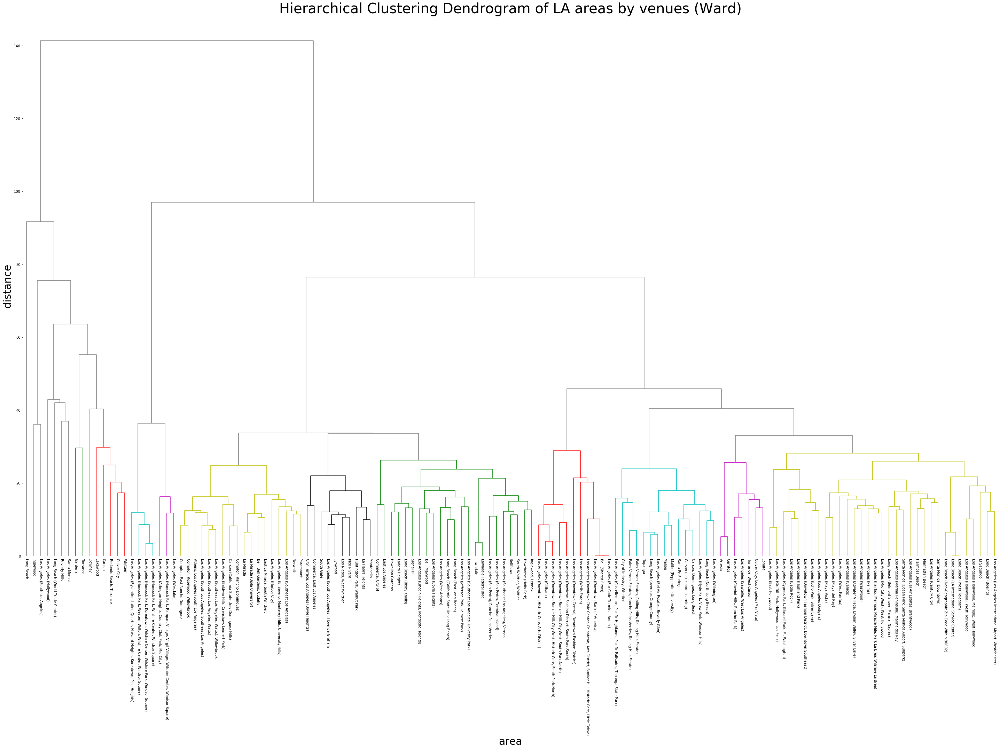

In [32]:
linkage_matrix = linkage(LA_grouped1, 'ward')

labels = list(LA_grouped1.index)

figure = plt.figure(figsize=(40, 30))
#hierarchy.set_link_color_palette(['#e8d0d9', '#e590a5', '#75638b', '#507592', '#dac291'])
dendrogram(
    linkage_matrix,
    color_threshold=30,
    labels=labels,
    leaf_font_size=10,
    leaf_rotation=270,
    above_threshold_color='grey'
)
plt.title('Hierarchical Clustering Dendrogram of LA areas by venues (Ward)', fontdict = {'fontsize' : 40})
plt.xlabel('area', fontdict = {'fontsize' : 30})
plt.ylabel('distance', fontdict = {'fontsize' : 30})
plt.tight_layout()
plt.savefig('Dendrogram to show similarity of LA neighborhoods.png')
plt.show()

After first look removed po box zipcodes and 7 zipcodes that showed identical (90073, 90506, 90095, 90089, 90842, 90847, 90848)

### Bring in Nashville data

In [33]:
data = [['37013', 'Nashville: Antioch / Cane Ridge'],
['37027', 'Nashville: Brentwood'],
['37072', 'Nashville: Goodlettsville'],
['37076', 'Nashville: Hermitage'],
['37115', 'Nashville: Madison'],
['37138', 'Nashville: Old Hickory'],
['37201', 'Nashville: Downtown'],
['37203', 'Nashville: Music Row / Edgehill / Vandy / West End Circle / Downtown (western) / The Gulch / Wedgewood Houston'],
['37204', 'Nashville: 12 South / Belmont / Lipscomb / Green Hills / Oak Hill / Edgehill'],
['37205', 'Nashville: Belle Meade / West Meade / West'],
['37206', 'Nashville: Lower East Nashville / Lockeland Springs'],
['37207', 'Nashville: North Nashville / Dickerson Pike'],
['37208', 'Nashville: Germantown / TSU'],
['37209', 'Nashville: Sylvan Park / Sylvan Heights / The Nations / Charlotte Park'],
['37210', 'Nashville: Woodbine / Glencliff / Briley / Elm Hill'],
['37211', 'Nashville: South Nashville/ Whispering Hills / Brentioch / Lenox'],
['37212', 'Nashville: Music Row / Vanderbilt / Hillsboro Village / Belmont'],
['37214', 'Nashville: Donelson / Airport'],
['37215', 'Nashville: Green Hills / Forest Hills / Belle Meade'],
['37216', 'Nashville: Inglewood'],
['37217', 'Nashville: Edge-O-Lake / Priest Lake / Briley Parkway'],
['37218', 'Nashville: Bordeaux'],
['37219', 'Nashville: Downtown / Central Business District'],
['37220', 'Nashville: Oak Hill / Crieve Hall'],
['37221', 'Nashville: Bellevue']]

# Data from https://nestinginnashville.com/buying-a-home-in-nashville/zip-code-map/

#### Create dataframe

In [34]:
areas = pd.DataFrame(data, columns = ['PostalCode', 'Neighbourhood']) 
print(areas.shape)
areas.head()

(25, 2)


,PostalCode,Neighbourhood
0,37013,Nashville: Antioch / Cane Ridge
1,37027,Nashville: Brentwood
2,37072,Nashville: Goodlettsville
3,37076,Nashville: Hermitage
4,37115,Nashville: Madison


#### Import lat and long

In [35]:
zipcodes = areas['PostalCode'].tolist()
postcode_details = nomi.query_postal_code(zipcodes)
postcode_details = pd.DataFrame(postcode_details).transpose()
postcode_details

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
postal_code,37013,37027,37072,37076,37115,37138,37201,37203,37204,37205,37206,37207,37208,37209,37210,37211,37212,37214,37215,37216,37217,37218,37219,37220,37221
country code,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US
place_name,Antioch,Brentwood,Goodlettsville,Hermitage,Madison,Old Hickory,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville
state_name,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee
state_code,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN
county_name,Davidson,Williamson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson
county_code,37,187,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37
community_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
community_code,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
latitude,36.0595,36.0063,36.3417,36.1848,36.2604,36.2416,36.1657,36.1504,36.1067,36.1114,36.1798,36.2195,36.1762,36.1546,36.1379,36.0725,36.1337,36.1633,36.0986,36.2125,36.1052,36.2071,36.1678,36.0641,36.0662


#### Join lat and long data to neighborhoods

In [36]:
areas = areas.transpose()
Nashville_zipcodes = pd.concat([areas, postcode_details])
Nashville_zipcodes

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19,20,21,22,23,24
PostalCode,37013,37027,37072,37076,37115,37138,37201,37203,37204,37205,37206,37207,37208,37209,37210,37211,37212,37214,37215,37216,37217,37218,37219,37220,37221
Neighbourhood,Nashville: Antioch / Cane Ridge,Nashville: Brentwood,Nashville: Goodlettsville,Nashville: Hermitage,Nashville: Madison,Nashville: Old Hickory,Nashville: Downtown,Nashville: Music Row / Edgehill / Vandy / West...,Nashville: 12 South / Belmont / Lipscomb / Gre...,Nashville: Belle Meade / West Meade / West,Nashville: Lower East Nashville / Lockeland Sp...,Nashville: North Nashville / Dickerson Pike,Nashville: Germantown / TSU,Nashville: Sylvan Park / Sylvan Heights / The ...,Nashville: Woodbine / Glencliff / Briley / Elm...,Nashville: South Nashville/ Whispering Hills /...,Nashville: Music Row / Vanderbilt / Hillsboro ...,Nashville: Donelson / Airport,Nashville: Green Hills / Forest Hills / Belle ...,Nashville: Inglewood,Nashville: Edge-O-Lake / Priest Lake / Briley ...,Nashville: Bordeaux,Nashville: Downtown / Central Business District,Nashville: Oak Hill / Crieve Hall,Nashville: Bellevue
postal_code,37013,37027,37072,37076,37115,37138,37201,37203,37204,37205,37206,37207,37208,37209,37210,37211,37212,37214,37215,37216,37217,37218,37219,37220,37221
country code,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US,US
place_name,Antioch,Brentwood,Goodlettsville,Hermitage,Madison,Old Hickory,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville,Nashville
state_name,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee,Tennessee
state_code,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN,TN
county_name,Davidson,Williamson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson,Davidson
county_code,37,187,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37,37
community_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


#### Drop unnecessary rows

In [37]:
Nashville_zipcodes = Nashville_zipcodes.drop(['postal_code' , 'community_name', 'community_code', 'accuracy', 'country code', 'state_name', 'county_code']).transpose()
Nashville_zipcodes

,PostalCode,Neighbourhood,place_name,state_code,county_name,latitude,longitude
0,37013,Nashville: Antioch / Cane Ridge,Antioch,TN,Davidson,36.0595,-86.6592
1,37027,Nashville: Brentwood,Brentwood,TN,Williamson,36.0063,-86.7909
2,37072,Nashville: Goodlettsville,Goodlettsville,TN,Davidson,36.3417,-86.7212
3,37076,Nashville: Hermitage,Hermitage,TN,Davidson,36.1848,-86.6002
4,37115,Nashville: Madison,Madison,TN,Davidson,36.2604,-86.7046
5,37138,Nashville: Old Hickory,Old Hickory,TN,Davidson,36.2416,-86.6117
6,37201,Nashville: Downtown,Nashville,TN,Davidson,36.1657,-86.7781
7,37203,Nashville: Music Row / Edgehill / Vandy / West...,Nashville,TN,Davidson,36.1504,-86.7916
8,37204,Nashville: 12 South / Belmont / Lipscomb / Gre...,Nashville,TN,Davidson,36.1067,-86.7743
9,37205,Nashville: Belle Meade / West Meade / West,Nashville,TN,Davidson,36.1114,-86.869


In [38]:
Nashville_zipcodes.to_csv(r'Nashville_zipcodes.csv')

#### Map Nashville neighborhoods

In [10]:
address = 'Nashville, TN'

geolocator = Nominatim(user_agent="nashville")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude

map_nashville = folium.Map(location=[latitude, longitude], zoom_start=11)

for lat, lng, area, post in zip(Nashville_zipcodes['latitude'], Nashville_zipcodes['longitude'], Nashville_zipcodes['Neighbourhood'], Nashville_zipcodes['PostalCode']):
    label = '{}: {}'.format(post, area)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=10,
        popup=label,
        color='#b286cc',
        fill=True,
        fill_color='#ddadff',
        fill_opacity=0.7,
        parse_html=False).add_to(map_nashville)  
    
map_nashville
# May not be visible in GitHub, see report for map

#### Get Nashville venues

In [40]:
nashville_venues = getNearbyVenues(names=Nashville_zipcodes['Neighbourhood'],
                                   latitudes=Nashville_zipcodes['latitude'],
                                   longitudes=Nashville_zipcodes['longitude']
                                  )

Nashville: Antioch / Cane Ridge
Nashville: Brentwood
Nashville: Goodlettsville
Nashville: Hermitage
Nashville: Madison
Nashville: Old Hickory
Nashville: Downtown
Nashville: Music Row / Edgehill / Vandy / West End Circle / Downtown (western) / The Gulch / Wedgewood Houston
Nashville: 12 South / Belmont / Lipscomb / Green Hills / Oak Hill / Edgehill
Nashville: Belle Meade / West Meade / West
Nashville: Lower East Nashville / Lockeland Springs
Nashville: North Nashville / Dickerson Pike
Nashville: Germantown / TSU
Nashville: Sylvan Park / Sylvan Heights / The Nations / Charlotte Park
Nashville: Woodbine / Glencliff / Briley / Elm Hill
Nashville: South Nashville/ Whispering Hills / Brentioch / Lenox
Nashville: Music Row / Vanderbilt / Hillsboro Village / Belmont
Nashville: Donelson / Airport
Nashville: Green Hills / Forest Hills / Belle Meade
Nashville: Inglewood
Nashville: Edge-O-Lake / Priest Lake / Briley Parkway
Nashville: Bordeaux
Nashville: Downtown / Central Business District
Nashvi

In [22]:
print(nashville_venues.shape) #Shows number of venues returned
nashville_venues.head(20)

(1730, 8)


,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,0,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Ford Ice Center,36.053014,-86.656621,Skating Rink
1,1,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Slim & Husky's,36.048414,-86.656214,Pizza Place
2,2,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Casa Fiesta,36.045180,-86.663239,Mexican Restaurant
3,3,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Mill Creek Greenway Trail,36.056369,-86.672999,Trail
4,4,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Starbucks,36.047958,-86.657313,Coffee Shop
5,5,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Zaxby's Chicken Fingers & Buffalo Wings,36.049856,-86.651551,Fried Chicken Joint
6,6,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Thorntons Inc,36.051673,-86.644662,Gas Station
7,7,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,AMC Theater,36.050990,-86.651680,Movie Theater
8,8,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Angelo's Picnic Pizza,36.070540,-86.635076,Pizza Place
9,9,Nashville: Antioch / Cane Ridge,36.0595,-86.6592,Dollar Tree,36.047077,-86.648674,Discount Store


#### Check venues correct in my area

In [24]:
my_area = nashville_venues['Neighborhood']=='Nashville: Sylvan Park / Sylvan Heights / The Nations / Charlotte Park'
my_area = nashville_venues[my_area]
my_area

,Unnamed: 0,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
917,917,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,Planet Fitness,36.149739,-86.860466,Gym / Fitness Center
918,918,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,VN Pho And Deli,36.149266,-86.863962,Vietnamese Restaurant
919,919,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,Hattie B's Hot Chicken,36.151674,-86.850804,Fried Chicken Joint
920,920,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,Bobbie's Dairy Dip,36.151655,-86.851300,Ice Cream Shop
921,921,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,McDougal's Chicken,36.146328,-86.857750,Fried Chicken Joint
922,922,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,The Cafe at Thistle Farms,36.152033,-86.849808,Café
923,923,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,Cook Out,36.149563,-86.861764,Fast Food Restaurant
924,924,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,Wendell Smith's Restaurant,36.152314,-86.851384,Diner
925,925,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,The Grilled Cheeserie,36.157454,-86.848623,Food Truck
926,926,Nashville: Sylvan Park / Sylvan Heights / The ...,36.1546,-86.8602,51 North Taproom,36.155731,-86.848573,Bar


Venues are familiar

#### Save venues to csv in case run out of Foursquare hits

In [45]:
nashville_venues.to_csv(r'nashville_venues.csv')

#### Onehot encode

In [42]:
nashville_onehot = pd.get_dummies(nashville_venues[['Venue Category']], prefix="", prefix_sep="")
nashville_onehot['Neighborhood'] = nashville_venues['Neighborhood'] 

nashville_grouped = nashville_onehot.groupby('Neighborhood').sum()
nashville_grouped.loc['average'] = nashville_grouped.mean()
nashville_grouped

,ATM,American Restaurant,Antique Shop,Arcade,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Australian Restaurant,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Bed & Breakfast,Beer Garden,Beer Store,Big Box Store,Bistro,Board Shop,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Building,Burger Joint,Burrito Place,Bus Station,Business Service,Café,Candy Store,Caribbean Restaurant,Chinese Restaurant,Chocolate Shop,Church,Clothing Store,Cocktail Bar,Coffee Shop,College Auditorium,College Basketball Court,Comfort Food Restaurant,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Distillery,Dive Bar,Dog Run,Donut Shop,Dosa Place,Electronics Store,Ethiopian Restaurant,Event Service,Event Space,Fabric Shop,Farmers Market,Fast Food Restaurant,Fish & Chips Shop,Flea Market,Flower Shop,Fondue Restaurant,Food,Food Court,Food Truck,Football Stadium,French Restaurant,Fried Chicken Joint,Fruit & Vegetable Store,Furniture / Home Store,Garden Center,Gas Station,Gastropub,Gay Bar,Gift Shop,Golf Course,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gym,Gym / Fitness Center,Halal Restaurant,Harbor / Marina,Hardware Store,Health & Beauty Service,Health Food Store,Historic Site,History Museum,Hobby Shop,Hockey Arena,Hostel,Hot Dog Joint,Hot Spring,Hotel,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Intersection,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Kids Store,Korean Restaurant,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Library,Light Rail Station,Lingerie Store,Liquor Store,Locksmith,Lounge,Market,Massage Studio,Mattress Store,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Middle School,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Motel,Motorcycle Shop,Movie Theater,Moving Target,Museum,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Noodle House,Optical Shop,Other Nightlife,Other Repair Shop,Outdoor Sculpture,Outlet Store,Paper / Office Supplies Store,Park,Performing Arts Venue,Pet Store,Pharmacy,Photography Studio,Pizza Place,Playground,Plaza,Pub,Racetrack,Record Shop,Recording Studio,Recreation Center,Rental Car Location,Rental Service,Residential Building (Apartment / Condo),Restaurant,Rock Climbing Spot,Rock Club,Roller Rink,Salon / Barbershop,Sandwich Place,Scenic Lookout,School,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Smoothie Shop,Snack Place,Soccer Field,Southern / Soul Food Restaurant,Spa,Speakeasy,Sporting Goods Shop,Sports Bar,Steakhouse,Storage Facility,Street Art,Supermarket,Supplement Shop,Sushi Restaurant,Taco Place,Tanning Salon,Tapas Restaurant,Tattoo Parlor,Tea Room,Tex-Mex Restaurant,Thai Restaurant,Theater,Theme Park Ride / Attraction,Thrift / Vintage Store,Tour Provider,Tourist Information Center,Toy / Game Store,Track,Trail,Tunnel,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Vineyard,Whisky Bar,Wine Bar,Wine Shop,Winery,Wings Joint,Women's Store,Yoga Studio,Zoo,Zoo Exhibit
Neighborhood,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Nashville: 12 South / Belmont / Lipscomb / Green Hills / Oak Hill / Edgehill,0.00,2.00,2.00,0.00,0.00,0.00,1.00,0.00,0.00,0.00,0.00,2.00,0.00,0.00,3.00,0.00,2.00,0.00,1.0,0.00,0.00,1.0,1.00,0.00,0.00,0.00,1.00,1.00,0.00,2.00,1.00,0.00,2.00,2.00,0.00,0.0,0.0,0.00,1.00,1.00,0.00,0.00,3.00,0.00,6.00,1.00,0.00,1.00,0.00,0.00,0.0,2.00,1.00,0.00,0.00,0.00,0.00,1.00,2.0,1.0,0.00,0.00,0.00,0.00,0.00,0.00,1.00,1.00,0.00,0.00,0.00,1

In [74]:
nashville_grouped.to_csv(r'nashville_grouped.csv')

In [43]:
nashville_grouped1 = nashville_grouped.drop(['average'])
nashville_grouped1.shape

(25, 235)

In [78]:
nashville_grouped1.to_csv(r'nashville_grouped1.csv')

#### Create dendrogram of Nashville

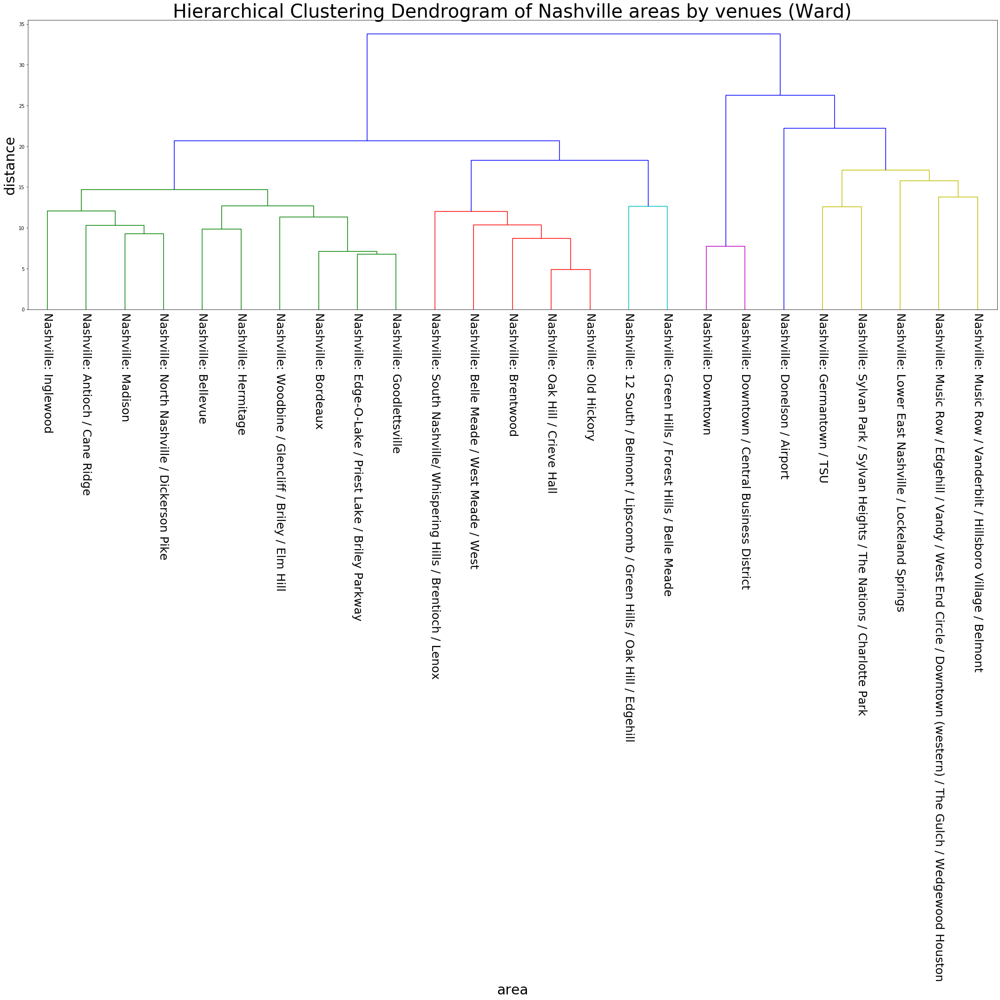

In [44]:
linkage_matrix2 = linkage(nashville_grouped1, 'ward')

labels = list(nashville_grouped1.index)

figure = plt.figure(figsize=(30, 30))
dendrogram(
    linkage_matrix2,
    color_threshold=18,
    labels=labels,
    leaf_font_size=25,
    leaf_rotation=270
)
plt.title('Hierarchical Clustering Dendrogram of Nashville areas by venues (Ward)', fontdict = {'fontsize' : 40})
plt.xlabel('area', fontdict = {'fontsize' : 30})
plt.ylabel('distance', fontdict = {'fontsize' : 30})
plt.tight_layout()
plt.savefig('Dendrogram to show similarity of Nashville neighborhoods.png')
plt.show()

#### Combine venue data on Nashville and LA

In [46]:
LA_Nash_onehot = pd.concat([LA_grouped1, nashville_grouped1])
LA_Nash_onehot

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.

  """Entry point for launching an IPython kernel.


,ATM,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Astrologer,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Bowling Green,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Car Wash,Caribbean Restaurant,Casino,Cave,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Football Field,College Gym,College Quad,College Residence Hall,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Dog Run,Donburi Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Middle School,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Mountain,Movie Theater,Moving Target,Multiplex,Muse

#### Replace NaN with 0

In [47]:
LA_Nash_onehot = LA_Nash_onehot.fillna(0)

In [48]:
LA_Nash_onehot.to_csv(r'LA_Nash_onehot.csv')

#### Create dendrogram of LA and Nashville

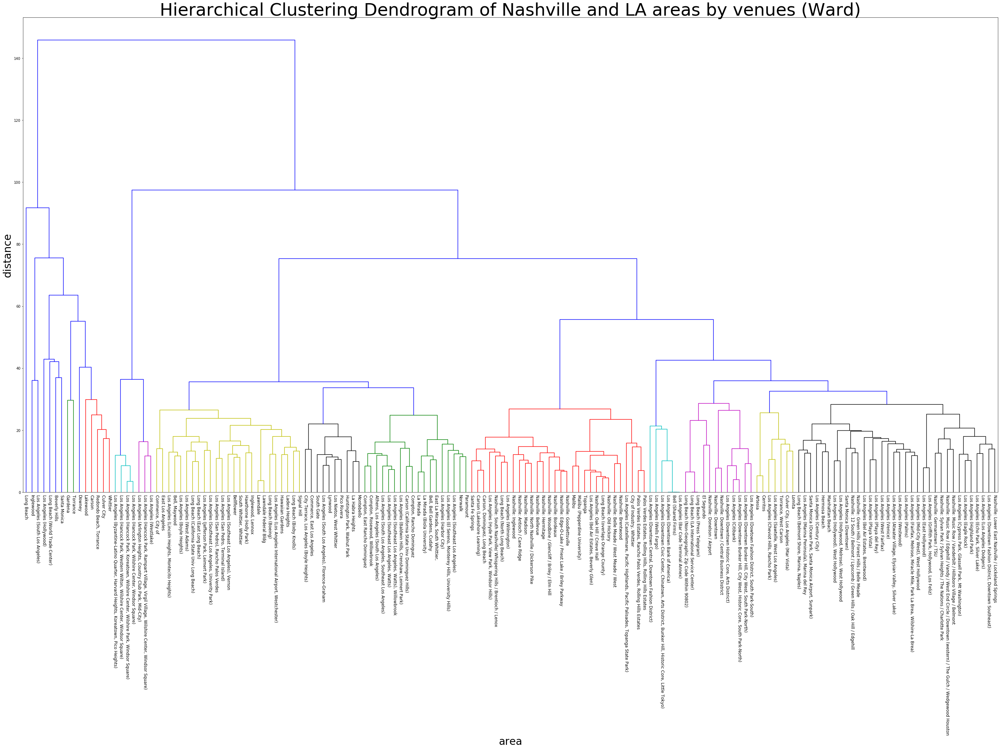

In [49]:
linkage_matrix3 = linkage(LA_Nash_onehot, 'ward')

labels = list(LA_Nash_onehot.index)

figure = plt.figure(figsize=(40, 30))
dendrogram(
    linkage_matrix3,
    color_threshold=30,
    labels=labels,
    leaf_font_size=12,
    leaf_rotation=270
)
plt.title('Hierarchical Clustering Dendrogram of Nashville and LA areas by venues (Ward)', fontdict = {'fontsize' : 50})
plt.xlabel('area', fontdict = {'fontsize' : 30})
plt.ylabel('distance', fontdict = {'fontsize' : 30})
plt.tight_layout()
plt.savefig('Dendrogram to show similarity of LA and Nashville neighborhoods.png')
plt.show()

## Add in house price data
Zipcode data from https://www.zillow.com/research/data/  
Downloaded and filtered to only relevant zipcodes in excel then uploaded

In [50]:
house_data = pd.read_csv('Zillow data.csv')
print(house_data.shape)
house_data.head()

(171, 19)


,Date,RegionID,RegionName,State,Metro,County,City,SizeRank,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI
0,9/30/2019,74246,37215,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,3684,666400,-0.001797,-0.009807,0.040762,0.062518,0.034459,2019-05,2019-Q2,676100,-0.014347,2019-02
1,9/30/2019,74113,37027,TN,Nashville-Davidson--Murfreesboro--Franklin,Williamson County,Brentwood,469,599900,0.000667,-0.000833,0.039328,0.052084,0.038896,2019-04,2019-Q2,602900,-0.004976,2019-02
2,9/30/2019,74236,37205,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,3334,598300,0.005546,0.011667,0.020293,0.066218,0.045125,2019-09,2019-Q3,598300,0.000000,2019-09
3,9/30/2019,74235,37204,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,6254,557000,0.007962,0.003423,0.025216,0.077165,0.063267,2019-04,2019-Q2,557700,-0.001255,2019-04
4,9/30/2019,74243,37212,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,5856,504900,0.002980,-0.001187,0.003777,0.074629,0.057672,2018-04,2018-Q2,518300,-0.025854,2017-09


#### Add geographical data to house price data

In [51]:
print(LA_zipcodes.shape)
LA_zipcodes.head()

(174, 7)


,PostalCode,Neighbourhood,place_name,state_code,county_name,latitude,longitude
0,90001,"Los Angeles (South Los Angeles), Florence-Graham",Los Angeles,CA,Los Angeles,33.9731,-118.248
1,90002,"Los Angeles (Southeast Los Angeles, Watts)",Los Angeles,CA,Los Angeles,33.9497,-118.246
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...",Los Angeles,CA,Los Angeles,33.9653,-118.273
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",Los Angeles,CA,Los Angeles,34.0762,-118.303
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",Los Angeles,CA,Los Angeles,34.0585,-118.301


In [52]:
print(Nashville_zipcodes.shape)
Nashville_zipcodes.head()

(25, 7)


,PostalCode,Neighbourhood,place_name,state_code,county_name,latitude,longitude
0,37013,Nashville: Antioch / Cane Ridge,Antioch,TN,Davidson,36.0595,-86.6592
1,37027,Nashville: Brentwood,Brentwood,TN,Williamson,36.0063,-86.7909
2,37072,Nashville: Goodlettsville,Goodlettsville,TN,Davidson,36.3417,-86.7212
3,37076,Nashville: Hermitage,Hermitage,TN,Davidson,36.1848,-86.6002
4,37115,Nashville: Madison,Madison,TN,Davidson,36.2604,-86.7046


In [53]:
LA_zipcodes['PostalCode'] = LA_zipcodes['PostalCode'].astype(int)
Nashville_zipcodes['PostalCode'] = Nashville_zipcodes['PostalCode'].astype(int)
LA_and_Nash = pd.concat([LA_zipcodes, Nashville_zipcodes])
LA_and_Nash = LA_and_Nash.reset_index(drop=True)
print(LA_and_Nash.shape)
LA_and_Nash

(199, 7)


,PostalCode,Neighbourhood,place_name,state_code,county_name,latitude,longitude
0,90001,"Los Angeles (South Los Angeles), Florence-Graham",Los Angeles,CA,Los Angeles,33.9731,-118.248
1,90002,"Los Angeles (Southeast Los Angeles, Watts)",Los Angeles,CA,Los Angeles,33.9497,-118.246
2,90003,"Los Angeles (South Los Angeles, Southeast Los ...",Los Angeles,CA,Los Angeles,33.9653,-118.273
3,90004,"Los Angeles (Hancock Park, Rampart Village, Vi...",Los Angeles,CA,Los Angeles,34.0762,-118.303
4,90005,"Los Angeles (Hancock Park, Koreatown, Wilshire...",Los Angeles,CA,Los Angeles,34.0585,-118.301
5,90006,"Los Angeles (Byzantine-Latino Quarter, Harvard...",Los Angeles,CA,Los Angeles,34.0493,-118.292
6,90007,"Los Angeles (Southeast Los Angeles, Univerity ...",Los Angeles,CA,Los Angeles,34.0294,-118.287
7,90008,"Los Angeles (Baldwin Hills, Crenshaw, Leimert ...",Los Angeles,CA,Los Angeles,34.0116,-118.341
8,90010,"Los Angeles (Hancock Park, Wilshire Center, Wi...",Los Angeles,CA,Los Angeles,34.0606,-118.303
9,90011,Los Angeles (Southeast Los Angeles),Los Angeles,CA,Los Angeles,34.0079,-118.258


In [54]:
house_data_merged = pd.merge(house_data, LA_and_Nash, how='outer', left_on='RegionName', right_on='PostalCode')
house_data_merged

,Date,RegionID,RegionName,State,Metro,County,City,SizeRank,Zhvi,MoM,QoQ,YoY,5Year,10Year,PeakMonth,PeakQuarter,PeakZHVI,PctFallFromPeak,LastTimeAtCurrZHVI,PostalCode,Neighbourhood,place_name,state_code,county_name,latitude,longitude
0,9/30/2019,74246.0,37215.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,3684.0,666400.0,-0.001797,-0.009807,0.040762,0.062518,0.034459,2019-05,2019-Q2,676100.0,-0.014347,2019-02,37215,Nashville: Green Hills / Forest Hills / Belle ...,Nashville,TN,Davidson,36.0986,-86.8219
1,9/30/2019,74113.0,37027.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Williamson County,Brentwood,469.0,599900.0,0.000667,-0.000833,0.039328,0.052084,0.038896,2019-04,2019-Q2,602900.0,-0.004976,2019-02,37027,Nashville: Brentwood,Brentwood,TN,Williamson,36.0063,-86.7909
2,9/30/2019,74236.0,37205.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,3334.0,598300.0,0.005546,0.011667,0.020293,0.066218,0.045125,2019-09,2019-Q3,598300.0,0.000000,2019-09,37205,Nashville: Belle Meade / West Meade / West,Nashville,TN,Davidson,36.1114,-86.869
3,9/30/2019,74235.0,37204.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,6254.0,557000.0,0.007962,0.003423,0.025216,0.077165,0.063267,2019-04,2019-Q2,557700.0,-0.001255,2019-04,37204,Nashville: 12 South / Belmont / Lipscomb / Gre...,Nashville,TN,Davidson,36.1067,-86.7743
4,9/30/2019,74243.0,37212.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,5856.0,504900.0,0.002980,-0.001187,0.003777,0.074629,0.057672,2018-04,2018-Q2,518300.0,-0.025854,2017-09,37212,Nashville: Music Row / Vanderbilt / Hillsboro ...,Nashville,TN,Davidson,36.1337,-86.8006
5,9/30/2019,74251.0,37220.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,10277.0,496600.0,0.003435,0.005874,0.033937,0.070647,0.047274,2019-02,2019-Q1,499500.0,-0.005806,2019-01,37220,Nashville: Oak Hill / Crieve Hall,Nashville,TN,Davidson,36.0641,-86.7697
6,9/30/2019,74234.0,37203.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,2299.0,399700.0,0.001002,-0.006710,0.010619,0.088477,0.060950,2019-02,2019-Q1,407300.0,-0.018659,2018-11,37203,Nashville: Music Row / Edgehill / Vandy / West...,Nashville,TN,Davidson,36.1504,-86.7916
7,9/30/2019,74232.0,37201.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,14032.0,350500.0,0.008343,0.024854,0.044087,0.077165,0.065069,2019-09,2019-Q3,350500.0,0.000000,2019-09,37201,Nashville: Downtown,Nashville,TN,Davidson,36.1657,-86.7781
8,9/30/2019,74237.0,37206.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,2526.0,345700.0,0.001448,0.004358,0.008460,0.113889,0.081171,2019-02,2019-Q1,355600.0,-0.027840,2018-11,37206,Nashville: Lower East Nashville / Lockeland Sp...,Nashville,TN,Davidson,36.1798,-86.7411
9,9/30/2019,74252.0,37221.0,TN,Nashville-Davidson--Murfreesboro--Franklin,Davidson County,Nashville,917.0,318700.0,0.001257,0.000628,0.037773,0.074220,0.045112,2019-09,2019-Q3,318700.0,0.000000,2019-09,37221,Nashville: Bellevue,Nashville,TN,Davidson,36.0662,-86.9639


In [76]:
house_data_merged.to_csv(r'house_data_merged.csv')

#### Drop unnecessary info

In [55]:
house_price_by_area = house_data_merged.filter(items=['Neighbourhood', 'Zhvi', 'state_code', 'PostalCode']).sort_values(by='Zhvi', ascending=False)
house_price_by_area = house_price_by_area.reset_index(drop=True)
house_price_by_area.dropna(inplace=True)
house_price_by_area

,Neighbourhood,Zhvi,state_code,PostalCode
0,Beverly Hills,4777200.0,CA,90210
1,Santa Monica,3942400.0,CA,90402
2,"Los Angeles (Castellemare, Pacific Highlands, ...",3010200.0,CA,90272
3,Malibu,2950800.0,CA,90265
4,Beverly Hills,2710300.0,CA,90212
5,"Los Angeles (Bel Air Estates, Brentwood)",2613500.0,CA,90049
6,"Los Angeles (Bel Air Estates, Beverly Glen)",2538000.0,CA,90077
7,Manhattan Beach,2415100.0,CA,90266
8,Beverly Hills,2373700.0,CA,90211
9,Los Angeles (Venice),1927900.0,CA,90291


In [56]:
house_price_by_area.to_csv(r'house_price_by_area.csv')

#### Plot median house price by neighborhood

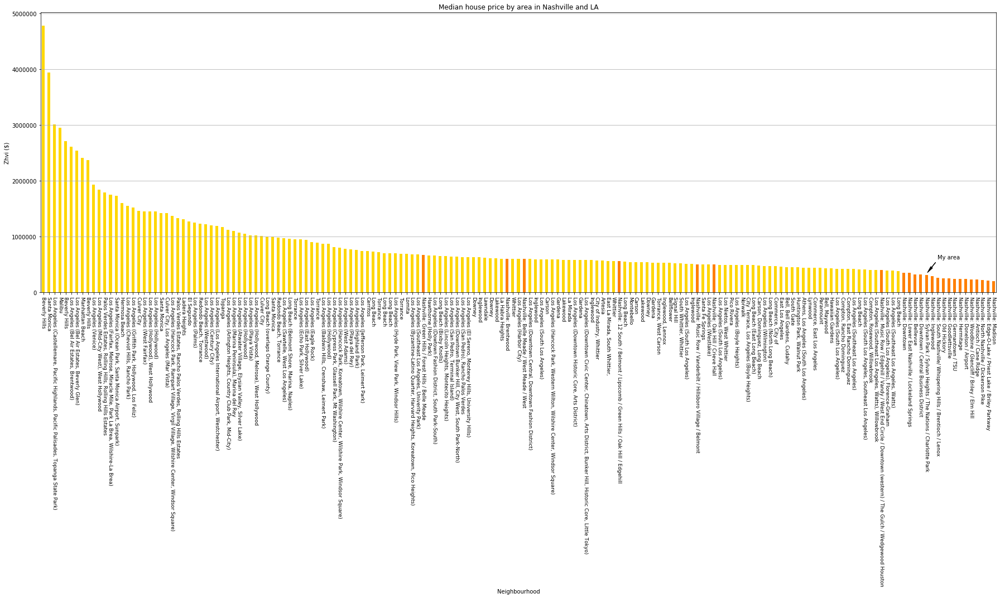

In [32]:
rcParams['figure.figsize'] = 25, 15
house_price_by_area.plot(kind='bar', x='Neighbourhood', y='Zhvi', color=house_price_by_area.state_code.map({'TN': '#FF7F00', 'CA':'#FFD700'}), legend=None)
plt.ylabel('Zhvi ($)')
plt.title('Median house price by area in Nashville and LA')
plt.xticks(fontsize=9, rotation=270)
plt.grid(which='both', axis='y')
#plt.axhline(1000000, linestyle='--', color='#edcd63')
#plt.axhline(2000000, linestyle='--', color='#d6b220')
plt.annotate('My area', xy=(158, 330000), xytext=(160, 600000), arrowprops=dict(facecolor='black', shrink=0.1, width=0.3, headwidth=4))
plt.tight_layout()
plt.savefig('Median house price by area in Nashville and LA.png')

### Example cases

#### What is the average house price of neighborhoods like Green Hills in LA?

In [30]:
green_hills_similar = house_price_by_area.index[house_price_by_area['PostalCode'].isin(['90049', '90094', '90293', '90035', '90291', '90039', '90024', '90034', '90036', '90048', '37215'])].tolist()
green_hills_similar_df = house_price_by_area.loc[green_hills_similar]
green_hills_similar_df = green_hills_similar_df.reset_index(drop=True)
green_hills_similar_df['Zhvi'] = green_hills_similar_df['Zhvi'].astype(int)
green_hills_similar_df 

,Unnamed: 0,Neighbourhood,Zhvi,state_code,PostalCode
0,5,"Los Angeles (Bel Air Estates, Brentwood)",2613500,CA,90049
1,9,Los Angeles (Venice),1927900,CA,90291
2,10,"Los Angeles (Mid-City West), West Hollywood",1841800,CA,90048
3,12,"Los Angeles (Fairfax, Melrose, Miracle Mile, P...",1746300,CA,90036
4,18,Los Angeles (West Fairfax),1454200,CA,90035
5,27,Los Angeles (Palms),1254900,CA,90034
6,29,Los Angeles (Westwood),1218700,CA,90024
7,35,"Los Angeles (Atwater Village, Elysian Valley, ...",1066100,CA,90039
8,37,Los Angeles (Playa Vista),1021600,CA,90094
9,55,Los Angeles (Playa del Rey),767000,CA,90293


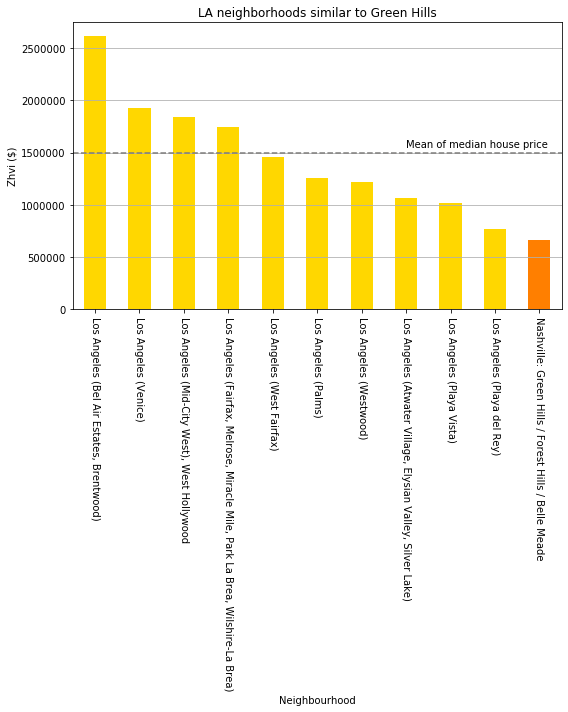

In [33]:
rcParams['figure.figsize'] = 8, 10
green_hills_similar_df.plot(kind='bar', x='Neighbourhood', y='Zhvi', color=green_hills_similar_df.state_code.map({'TN': '#FF7F00', 'CA':'#FFD700'}), legend=None)
plt.ylabel('Zhvi ($)')
plt.title('LA neighborhoods similar to Green Hills')
plt.xticks(fontsize=10, rotation=270)
plt.grid(which='both', axis='y')
plt.axhline(1491200, linestyle='--', color='#7d7c7b')
plt.annotate('Mean of median house price', xy=(7, 1550000))
plt.tight_layout()
plt.savefig('Green Hills Similar.png')

In [26]:
green_hills_similar_df.to_csv(r'green_hills_similar_df.csv')

In [27]:
green_hills_similar_df['Zhvi'].mean().astype(int)

1491200

In [28]:
666400/1491200

0.4468884120171674

#### What is the average price of LA neighborhoods like my area?

In [34]:
SP_similar = house_price_by_area.index[house_price_by_area['PostalCode'].isin(['90026', '90090', '90021', '90065', '90041', '90042', '37209'])].tolist()
SP_similar_df = house_price_by_area.loc[SP_similar]
SP_similar_df = SP_similar_df.reset_index(drop=True)
SP_similar_df['Zhvi'] = SP_similar_df['Zhvi'].astype(int)
SP_similar_df 

,Unnamed: 0,Neighbourhood,Zhvi,state_code,PostalCode
0,46,"Los Angeles (Echo Park, Silver Lake)",950000,CA,90026
1,48,Los Angeles (Eagle Rock),899600,CA,90041
2,52,"Los Angeles (Cypress Park, Glassell Park, Mt W...",813900,CA,90065
3,56,Los Angeles (Highland Park),763600,CA,90042
4,158,Nashville: Sylvan Park / Sylvan Heights / The ...,308000,TN,37209


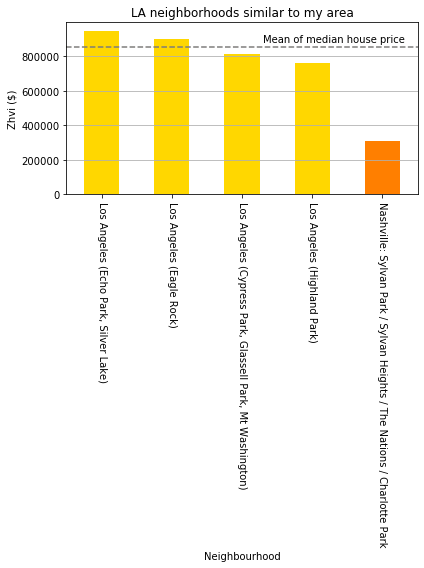

In [39]:
rcParams['figure.figsize'] = 6, 8
SP_similar_df.plot(kind='bar', x='Neighbourhood', y='Zhvi', color=SP_similar_df.state_code.map({'TN': '#FF7F00', 'CA':'#FFD700'}), legend=None)
plt.ylabel('Zhvi ($)')
plt.title('LA neighborhoods similar to my area')
plt.xticks(fontsize=10, rotation=270)
plt.grid(which='both', axis='y')
plt.axhline(856775, linestyle='--', color='#7d7c7b')
plt.annotate('Mean of median house price', xy=(2.3, 880000))
plt.tight_layout()
plt.savefig('SP Similar.png')

In [48]:
SP_similar_df.to_csv(r'SP_similar_df.csv')

In [49]:
SP_similar_df['Zhvi'].mean().astype(int)

856775

In [50]:
856775/308000

2.781737012987013

#### Top venues in Beverly Hills

In [66]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

In [67]:
LA_Nash2 = LA_Nash_onehot.reset_index()
LA_Nash2.head()

,Neighborhood,ATM,Accessories Store,Adult Boutique,African Restaurant,Airport,Airport Lounge,Airport Service,Airport Terminal,American Restaurant,Amphitheater,Antique Shop,Aquarium,Arcade,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Astrologer,Athletics & Sports,Australian Restaurant,Auto Dealership,Auto Garage,Automotive Shop,BBQ Joint,Baby Store,Bagel Shop,Bakery,Bank,Bar,Baseball Field,Baseball Stadium,Basketball Court,Basketball Stadium,Beach,Bed & Breakfast,Beer Bar,Beer Garden,Beer Store,Big Box Store,Bike Rental / Bike Share,Bike Shop,Bike Trail,Bistro,Board Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Bowling Green,Boxing Gym,Brazilian Restaurant,Breakfast Spot,Brewery,Bridal Shop,Bridge,Bubble Tea Shop,Buffet,Building,Burger Joint,Burmese Restaurant,Burrito Place,Bus Station,Business Service,Butcher,Cafeteria,Café,Cajun / Creole Restaurant,Cambodian Restaurant,Camera Store,Campground,Canal,Candy Store,Car Wash,Caribbean Restaurant,Casino,Cave,Cemetery,Cheese Shop,Chinese Restaurant,Chocolate Shop,Church,Churrascaria,Circus,City Hall,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Academic Building,College Administrative Building,College Arts Building,College Auditorium,College Baseball Diamond,College Basketball Court,College Bookstore,College Cafeteria,College Classroom,College Football Field,College Gym,College Quad,College Residence Hall,College Stadium,College Theater,Comedy Club,Comfort Food Restaurant,Comic Shop,Community Center,Concert Hall,Construction & Landscaping,Convenience Store,Convention Center,Cosmetics Shop,Costume Shop,Coworking Space,Creperie,Cuban Restaurant,Cultural Center,Cupcake Shop,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Design Studio,Dessert Shop,Diner,Disc Golf,Discount Store,Distillery,Distribution Center,Dive Bar,Dive Shop,Dog Run,Donburi Restaurant,Donut Shop,Dosa Place,Drugstore,Dry Cleaner,Dumpling Restaurant,Electronics Store,Empanada Restaurant,English Restaurant,Ethiopian Restaurant,Event Service,Event Space,Exhibit,Fabric Shop,Falafel Restaurant,Farm,Farmers Market,Fast Food Restaurant,Field,Filipino Restaurant,Film Studio,Financial or Legal Service,Fish & Chips Shop,Fish Market,Fishing Store,Flea Market,Flower Shop,Fondue Restaurant,Food,Food & Drink Shop,Food Court,Food Stand,Food Truck,Football Stadium,Fountain,Frame Store,French Restaurant,Fried Chicken Joint,Frozen Yogurt Shop,Fruit & Vegetable Store,Furniture / Home Store,Gaming Cafe,Garden,Garden Center,Gas Station,Gastropub,Gay Bar,General Entertainment,General Travel,German Restaurant,Gift Shop,Gluten-free Restaurant,Go Kart Track,Golf Course,Golf Driving Range,Gourmet Shop,Government Building,Greek Restaurant,Grocery Store,Gun Range,Gun Shop,Gym,Gym / Fitness Center,Gym Pool,Gymnastics Gym,Halal Restaurant,Harbor / Marina,Hardware Store,Hawaiian Restaurant,Health & Beauty Service,Health Food Store,High School,Himalayan Restaurant,Historic Site,History Museum,Hobby Shop,Hockey Arena,Home Service,Hookah Bar,Hospital,Hostel,Hot Dog Joint,Hot Spring,Hotel,Hotel Bar,Hotel Pool,Hotpot Restaurant,IT Services,Ice Cream Shop,Indian Restaurant,Indie Movie Theater,Indie Theater,Indonesian Restaurant,Insurance Office,Intersection,Italian Restaurant,Japanese Curry Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Jewish Restaurant,Juice Bar,Karaoke Bar,Kids Store,Kitchen Supply Store,Korean Restaurant,Kosher Restaurant,Lake,Latin American Restaurant,Laundromat,Laundry Service,Lawyer,Leather Goods Store,Lebanese Restaurant,Library,Light Rail Station,Lighthouse,Lingerie Store,Liquor Store,Locksmith,Lounge,Mac & Cheese Joint,Marijuana Dispensary,Market,Martial Arts Dojo,Massage Studio,Mattress Store,Medical Center,Mediterranean Restaurant,Men's Store,Mexican Restaurant,Middle Eastern Restaurant,Middle School,Miscellaneous Shop,Mobile Phone Shop,Monument / Landmark,Moroccan Restaurant,Motel,Motorcycle Shop,Motorsports Shop,Mountain,Movie Theater,Moving Target,M

In [68]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = LA_Nash2['Neighborhood']

for ind in np.arange(LA_Nash2.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(LA_Nash2.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()


,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Artesia,Indian Restaurant,Grocery Store,Ice Cream Shop,Korean Restaurant,Bakery,Chinese Restaurant,Filipino Restaurant,Café,Coffee Shop,Cosmetics Shop
1,"Athens, Los Angeles (South Los Angeles)",Fast Food Restaurant,Pizza Place,Fried Chicken Joint,Sandwich Place,Convenience Store,Grocery Store,Gas Station,Burger Joint,Southern / Soul Food Restaurant,American Restaurant
2,Bell (Shared Firms),Bar,Coffee Shop,Japanese Restaurant,Ice Cream Shop,Sushi Restaurant,Bookstore,Gastropub,Theater,Plaza,Mexican Restaurant
3,"Bell, Bell Gardens, Cudahy",Mexican Restaurant,Fast Food Restaurant,Coffee Shop,Convenience Store,American Restaurant,Bakery,Pizza Place,Sandwich Place,Seafood Restaurant,Latin American Restaurant
4,"Bell, Maywood",Mexican Restaurant,Burger Joint,Coffee Shop,Pizza Place,Sandwich Place,Convenience Store,Seafood Restaurant,Indian Restaurant,Bakery,Paper / Office Supplies Store


In [69]:
neighborhoods_venues_sorted.to_csv(r'neighborhoods_venues_sorted.csv')

In [57]:
BeV_SM = neighborhoods_venues_sorted.index[neighborhoods_venues_sorted['Neighborhood'].isin(['Beverly Hills'])].tolist()
BeV_SM_df = neighborhoods_venues_sorted.loc[BeV_SM]
BeV_SM_df = BeV_SM_df.reset_index(drop=True)
BeV_SM_df 

,Unnamed: 0,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,6,Beverly Hills,Hotel,American Restaurant,Italian Restaurant,Coffee Shop,Boutique,Park,Sushi Restaurant,Café,Steakhouse,Clothing Store


In [71]:
Hotel1 = neighborhoods_venues_sorted.index[neighborhoods_venues_sorted['1st Most Common Venue'].isin(['Hotel'])].tolist()
Hotel1_df = neighborhoods_venues_sorted.loc[Hotel1]
Hotel1_df = Hotel1_df.reset_index(drop=True)
Hotel1_df 

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,Beverly Hills,Hotel,American Restaurant,Italian Restaurant,Coffee Shop,Boutique,Park,Sushi Restaurant,Café,Steakhouse,Clothing Store
1,El Segundo,Hotel,American Restaurant,Sandwich Place,Coffee Shop,Pizza Place,Airport Lounge,Airport Service,Mexican Restaurant,Beach,Burger Joint
2,"Los Angeles (Dowtown Fashion District, South P...",Hotel,Coffee Shop,Bar,Theater,New American Restaurant,American Restaurant,Taco Place,Mexican Restaurant,Sushi Restaurant,Italian Restaurant
3,Los Angeles (Hollywood),Hotel,Lounge,Pizza Place,Coffee Shop,Bar,Nightclub,Gym,Burger Joint,American Restaurant,Café
4,"Los Angeles (Hollywood), West Hollywood",Hotel,Gym,Burger Joint,Trail,Coffee Shop,Vegetarian / Vegan Restaurant,Scenic Lookout,French Restaurant,Comedy Club,Music Store
5,"Los Angeles (Hollywood, Melrose), West Hollywood",Hotel,Gym,Mexican Restaurant,New American Restaurant,French Restaurant,Burger Joint,Café,Bakery,Clothing Store,Vegetarian / Vegan Restaurant
6,Nashville: Donelson / Airport,Hotel,Sandwich Place,Fast Food Restaurant,Pizza Place,American Restaurant,Gas Station,Discount Store,Pharmacy,Mexican Restaurant,Automotive Shop
7,Nashville: Music Row / Edgehill / Vandy / West...,Hotel,Pizza Place,Music Venue,American Restaurant,Coffee Shop,Mexican Restaurant,Burger Joint,Bar,BBQ Joint,Italian Restaurant


In [72]:
Hotel1_df.to_csv(r'Hotel1_df.csv')

#### Neighborhoods like south nash

In [81]:
south = LA_Nash_onehot.index[LA_Nash_onehot['Neighborhood'].isin(["Long Beach (North Long Beach)", "Los Angeles (Wilmington)", "Nashville: South Nashville/ Whispering Hills / Brentioch / Lenox"])].tolist()
south_df = LA_Nash_onehot.loc[south]
south_df = south_df.set_index('Neighborhood')
south_df = south_df.loc[:, (south_df != 0).any(axis=0)]
print(south_df.shape)
south_df

(3, 77)


,ATM,American Restaurant,BBQ Joint,Bank,Bar,Baseball Field,Big Box Store,Boat or Ferry,Breakfast Spot,Burger Joint,Cajun / Creole Restaurant,Chinese Restaurant,Coffee Shop,Convenience Store,Cosmetics Shop,Cuban Restaurant,Dessert Shop,Diner,Discount Store,Donut Shop,Dosa Place,Ethiopian Restaurant,Fast Food Restaurant,Food,Food Court,Food Truck,Fried Chicken Joint,Golf Course,Government Building,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Hardware Store,Home Service,Hot Dog Joint,Hotel,Ice Cream Shop,Indian Restaurant,Intersection,Italian Restaurant,Korean Restaurant,Laundromat,Market,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Museum,Optical Shop,Other Great Outdoors,Paper / Office Supplies Store,Park,Peruvian Restaurant,Pet Store,Pharmacy,Pizza Place,Port,Restaurant,Salon / Barbershop,Sandwich Place,Seafood Restaurant,Smoke Shop,Southern / Soul Food Restaurant,Sports Club,Supermarket,Supplement Shop,Taco Place,Tea Room,Thai Restaurant,Theme Park Ride / Attraction,Thrift / Vintage Store,Train Station,Wings Joint,Zoo,Zoo Exhibit
Neighborhood,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
Long Beach (North Long Beach),0.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,5.0,1.0,0.0,1.0,0.0,0.0,2.0,0.0,0.0,3.0,1.0,0.0,0.0,2.0,0.0,0.0,0.0,3.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,5.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,2.0,0.0,0.0,0.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
Los Angeles (Wilmington),1.0,3.0,0.0,2.0,0.0,2.0,0.0,1.0,0.0,3.0,0.0,2.0,1.0,5.0,1.0,0.0,0.0,1.0,3.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,3.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,6.0,0.0,0.0,1.0,1.0,0.0,0.0,1.0,2.0,0.0,0.0,2.0,4.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,0.0,2.0,1.0,1.0,0.0,0.0
Nashville: South Nashville/ Whispering Hills / Brentioch / Lenox,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,0.0,1.0,3.0,1.0,0.0,1.0,1.0,3.0,0.0,0.0,0.0,0.0,0.0,0.0,2.0,1.0,0.0,1.0,1.0,0.0,1.0,1.0,4.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,1.0,0.0,1.0,0.0,0.0,0.0,1.0,1.0,1.0,0.0,1.0,1.0,4.0


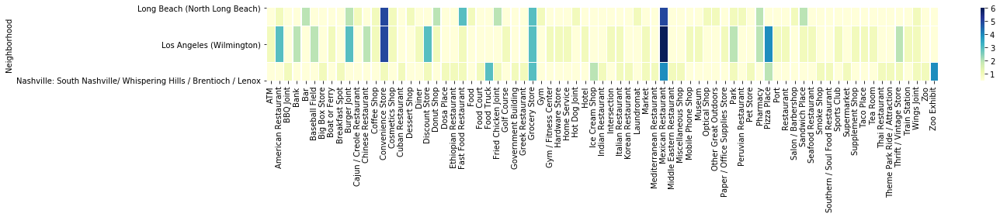

In [96]:
rcParams['figure.figsize'] = 20, 4
sns.heatmap(south_df, linewidths=.5, cmap="YlGnBu", vmin=0.5)
plt.tight_layout()

#### Word cloud of LA and Nashville venues

In [9]:
!conda install -c conda-forge wordcloud==1.4.1 --yes
from wordcloud import WordCloud, STOPWORDS
print ('Wordcloud is installed and imported!')

Solving environment: done


==> WARNING: A newer version of conda exists. <==
  current version: 4.5.11
  latest version: 4.7.12

Please update conda by running

    $ conda update -n base -c defaults conda



## Package Plan ##

  environment location: /home/jupyterlab/conda/envs/python

  added / updated specs: 
    - wordcloud==1.4.1


The following packages will be downloaded:

    package                    |            build
    ---------------------------|-----------------
    wordcloud-1.4.1            |           py36_0         324 KB  conda-forge

The following NEW packages will be INSTALLED:

    wordcloud: 1.4.1-py36_0 conda-forge


wordcloud-1.4.1      | 324 KB    | ##################################### | 100% 
Preparing transaction: done
Verifying transaction: done
Executing transaction: done
Wordcloud is installed and imported!


In [11]:
All_LA_cats = LA_venues['Venue Category'].tolist()

In [16]:
with open("All_LA_cats.txt", "w") as output:
    output.write(str(All_LA_cats))
All_LA_cats = open('All_LA_cats.txt', 'r').read()

In [14]:
stopwords = set(STOPWORDS)

In [18]:
LA_wc = WordCloud(
    background_color='white',
    stopwords=stopwords
)
LA_wc.generate(All_LA_cats)

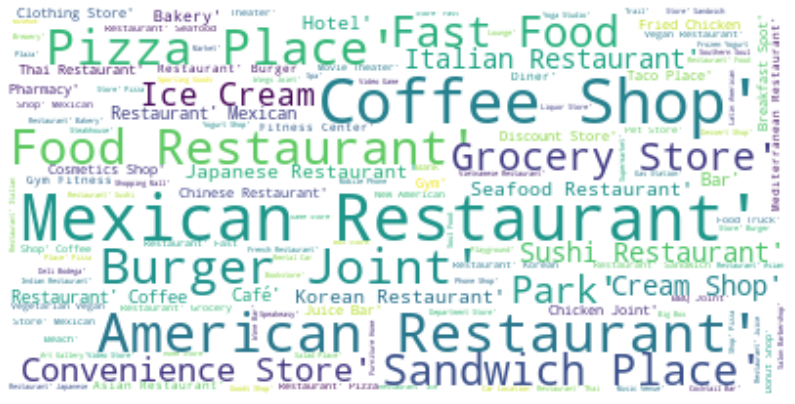

In [25]:
fig = plt.figure()
fig.set_figwidth(14)
fig.set_figheight(18)
plt.imshow(LA_wc, interpolation='bilinear')
plt.axis('off')
plt.show()

In [26]:
All_Nash_cats = nashville_venues['Venue Category'].tolist()

In [27]:
with open("All_Nash_cats.txt", "w") as output:
    output.write(str(All_Nash_cats))
All_Nash_cats = open('All_Nash_cats.txt', 'r').read()

In [28]:
Nash_wc = WordCloud(
    background_color='white',
    stopwords=stopwords
)
Nash_wc.generate(All_Nash_cats)

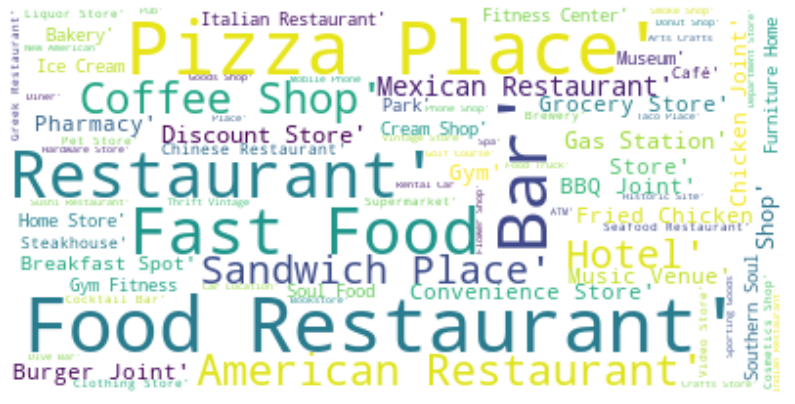

In [29]:
fig = plt.figure()
fig.set_figwidth(14)
fig.set_figheight(18)
plt.imshow(Nash_wc, interpolation='bilinear')
plt.axis('off')
plt.show()

#### Thank you for reading :)